# Audio Seperation Outlier Detection

In [2]:
import librosa
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import pandas as pd
import soundfile as sf
import matplotlib.pyplot as plt
import seaborn as sns
import IPython

## Background

Outlier detection is a common use-case for clustering algorithms, especially in the realm of fraud detection, spam mail, etc. Instead of fraud detection approaches, I thought audio segmentation would be another interesting application for outlier detection with clustering. This ML approach is a challenging task given the nature of how sound is used in a computational setting, which requires some DSP (digital signal processing) background.

### Audio Segmentation Importance
As I was researching this problem, I found that audio outlier detection is an interesting problem that can be applied to a lot of domains. In the realm of public safety, we can use audio segmentation to seperate sounds like normal city sounds, bird chirps, as well as outlier events like gunshots. This can be applied to a full-stack system where authorities can be alerted about those outlier events autonomously. 

Another cool use-case for audio segmentation is music composition. We can take any song from the internet and separate the voices based on instrument; for example, guitar, bass, drums, and vocals. Clustering algorithms can be applied to this space to separate the voices, and with a full-stack system, can be applied to music editing, genre classification, or even music generation.


### My Application
For my application, I am applying audio segmentation to trail camera data. For my example, I have found an under minute long sound file containing normal forest noises: rustling branches, wind, bird chirps, that also includes an outlier (uncommon) event of a screaming mountain lion. The assumption here is that in most geographical settings, we don't experience mountain lion screaming everyday (it's an outlier event), and the common (non-outlier) event would be the forest sounds. 


In [29]:
audio_file = "mountain_lion_scream.wav"
audio_data, sr = librosa.load(audio_file)
# Extract features (MFCCs as an example)
mfccs = librosa.feature.mfcc(y=audio_data, sr=sr, n_mfcc=13)

# Transpose the feature matrix to have time on the x-axis
mfccs_transposed = np.transpose(mfccs)

print(audio_data.shape) # 1D array with 1138688 components.
print(audio_data.shape[0] / sr) # 51 second audio clip.
print(mfccs.shape) # 2225 frames, each with 13 features.

(1138688,)
51.641179138321995
(13, 2225)


In [30]:
IPython.display.Audio(r"./mountain_lion_scream.wav")

## DSP Background for Problem

With the overall complicated nature of sound data, it is important to effectively process it beforehand so K-means can apply the data effectively. In order to do audio segmentation, the original audio data needs to run through some transformations first. After reading some sources online, the most widely used transformation for audio data in this space is **MFCC** (Mel-Frequency Cepstral Coefficients).

To compute the cepstrum, all we need is a time domain signal, which is essentially just the audio data. This goes through mutliple parts: computing the DFT (discrete fourier transform) on the signal, applying the log on that output, and then taking the DFT inverse of it. Essentially, this is a spectrum of a spectrum, but it's coined as a "cepstrum". 

### Visualizing the Original Sound File

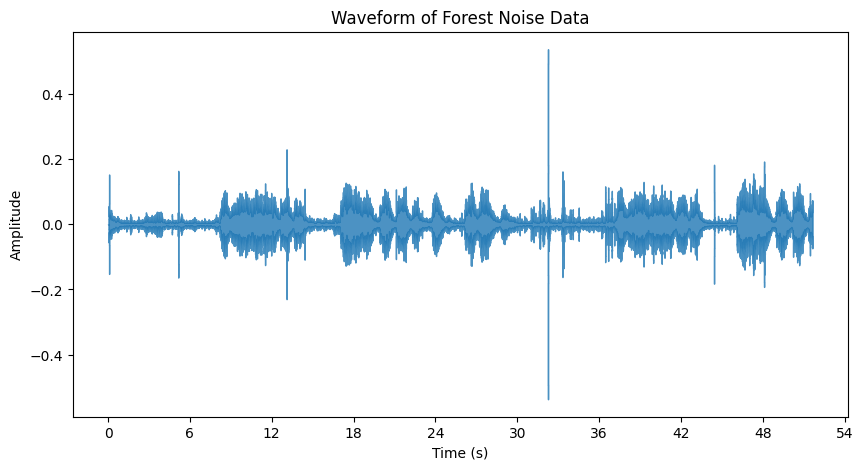

In [31]:
# Create a time axis in seconds
time = librosa.times_like(audio_data, sr=sr)

# Plot the waveform
plt.figure(figsize=(10, 5))
librosa.display.waveshow(audio_data, sr=sr, alpha=0.8)
plt.title('Waveform of Forest Noise Data')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

### Visualize the MFCCS Transformation

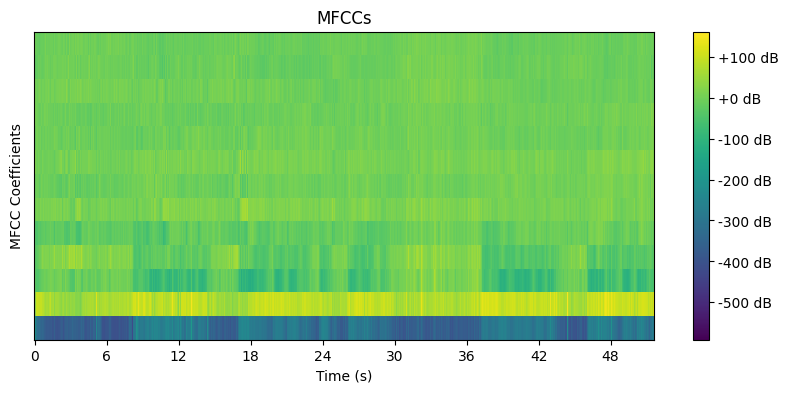

In [32]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs, x_axis='time', sr=sr, cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.title('MFCCs')
plt.xlabel('Time (s)')
plt.ylabel('MFCC Coefficients')
plt.show()

d:\Users\dwh71\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
d:\Users\dwh71\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


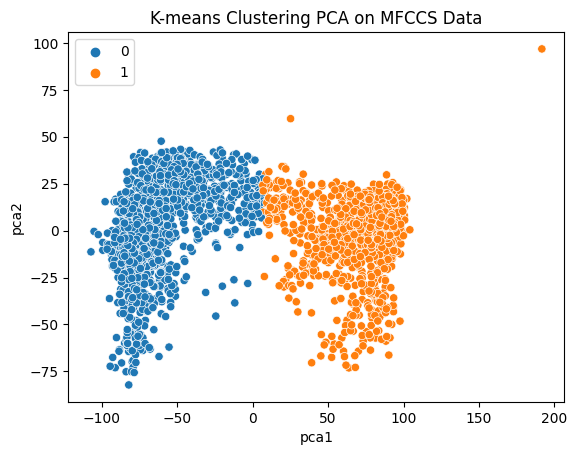

In [34]:
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(mfccs_transposed)

labels = kmeans.labels_

pca = PCA(n_components=2).fit_transform(mfccs_transposed)
df_pca = pd.DataFrame(pca,columns=['pca1','pca2'])

sns.scatterplot(x="pca1", y="pca2", hue=kmeans.fit_predict(mfccs_transposed), data=df_pca)
plt.title('K-means Clustering PCA on MFCCS Data')
plt.show()

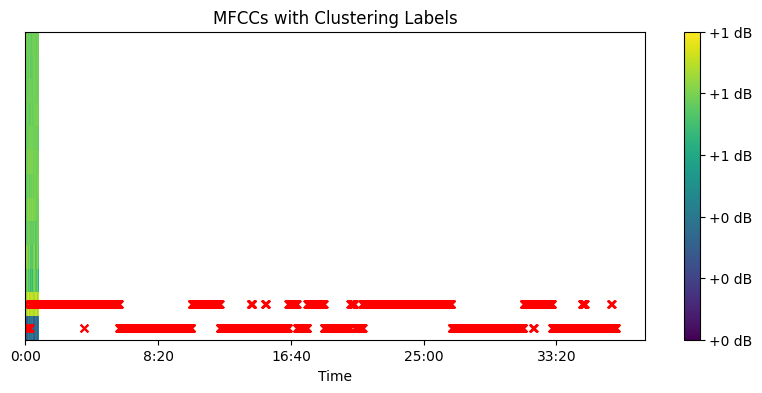

In [35]:
# Visualize the clusters
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs, x_axis='time', sr=sr, hop_length=512, cmap='viridis')
plt.scatter(np.arange(len(cluster_labels)), cluster_labels, color='red', marker='x', s=30)
plt.title('MFCCs with Clustering Labels')
plt.colorbar(format='%+2.0f dB')
plt.show()

In [36]:
# Separate voices based on cluster assignments
voices = [mfccs_transposed[cluster_labels == label] for label in np.unique(cluster_labels)]

# # Save the separated voices to audio files
for i, voice_mfcc in enumerate(voices):
    voice = librosa.feature.inverse.mfcc_to_audio(voice_mfcc.T)
    sf.write(f'separated_voice_{i}.wav', voice, sr)

In [37]:
IPython.display.Audio(r"./separated_voice_0.wav") # mostly screaming mountain lion

In [39]:
IPython.display.Audio(r"./separated_voice_1.wav") # mostly forest sounds